# Getting started with TinyTimeMixer (TTM)

This notebooke demonstrates the usage of a pre-trained `TinyTimeMixer` model for several multivariate time series forecasting tasks. For details related to model architecture, refer to the [TTM paper](https://arxiv.org/pdf/2401.03955.pdf).

In this example, we will use a pre-trained TTM-512-96 model. That means the TTM model can take an input of 512 time points (`context_length`), and can forecast upto 96 time points (`forecast_length`) in the future. We will use the pre-trained TTM in two settings:
1. **Zero-shot**: The pre-trained TTM will be directly used to evaluate on the `test` split of the target data. Note that the TTM was NOT pre-trained on the target data.
2. **Few-shot**: The pre-trained TTM will be quickly fine-tuned on only 5% of the `train` split of the target data, and subsequently, evaluated on the `test` part of the target data.

Note: Alternatively, this notebook can be modified to try any other TTM model from a suite of TTM models. For details, visit the [Hugging Face TTM Model Repository](https://huggingface.co/ibm-granite/granite-timeseries-ttm-r2).

1. IBM Granite TTM-R1 pre-trained models can be found here: [Granite-TTM-R1 Model Card](https://huggingface.co/ibm-granite/granite-timeseries-ttm-r1)
2. IBM Granite TTM-R2 pre-trained models can be found here: [Granite-TTM-R2 Model Card](https://huggingface.co/ibm-granite/granite-timeseries-ttm-r2)
3. Research-use (non-commercial use only) TTM-R2 pre-trained models can be found here: [Research-Use-TTM-R2](https://huggingface.co/ibm-research/ttm-research-r2)

### The get_model() utility
TTM Model card offers a suite of models with varying `context_length` and `prediction_length` combinations.
In this notebook, we will utilize the TSFM `get_model()` utility that automatically selects the right model based on the given input `context_length` and `prediction_length` (and some other optional arguments) abstracting away the internal complexity. See the usage examples below in the `zeroshot_eval()` and `fewshot_finetune_eval()` functions. For more details see the [docstring](https://github.com/ibm-granite/granite-tsfm/blob/main/tsfm_public/toolkit/get_model.py) of the function definition.

## Install `tsfm`
**[Optional for Local Run / Mandatory for Google Colab]**  
Run the below cell to install `tsfm`. Skip if already installed.

In [1]:
# Install the tsfm library
! pip install "granite-tsfm[notebooks] @ git+https://github.com/ibm-granite/granite-tsfm.git@v0.2.22"

  Cloning https://github.com/ibm-granite/granite-tsfm.git (to revision v0.2.22) to /tmp/pip-install-_dy5a02a/granite-tsfm_8807573aeafa47fe92ce719a330e2a49
  Running command git clone --filter=blob:none --quiet https://github.com/ibm-granite/granite-tsfm.git /tmp/pip-install-_dy5a02a/granite-tsfm_8807573aeafa47fe92ce719a330e2a49
  Running command git checkout -q 216850d0cb073e31689049c1334f701fe11bc2c3
  Resolved https://github.com/ibm-granite/granite-tsfm.git to commit 216850d0cb073e31689049c1334f701fe11bc2c3
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 50.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.2/144.2 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Imports

In [1]:
import math
import os
import tempfile

import pandas as pd
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from transformers import EarlyStoppingCallback, Trainer, TrainingArguments, set_seed
from transformers.integrations import INTEGRATION_TO_CALLBACK

from tsfm_public import TimeSeriesPreprocessor, TrackingCallback, count_parameters, get_datasets
from tsfm_public.toolkit.get_model import get_model
from tsfm_public.toolkit.lr_finder import optimal_lr_finder
from tsfm_public.toolkit.visualization import plot_predictions

In [2]:
import warnings


# Suppress all warnings
warnings.filterwarnings("ignore")

### Important arguments

In [3]:
# Set seed for reproducibility
SEED = 42
set_seed(SEED)

# TTM Model path. The default model path is Granite-R2. Below, you can choose other TTM releases.
TTM_MODEL_PATH = "ibm-granite/granite-timeseries-ttm-r2"
# TTM_MODEL_PATH = "ibm-granite/granite-timeseries-ttm-r1"
# TTM_MODEL_PATH = "ibm-research/ttm-research-r2"

# Context length, Or Length of the history.
# Currently supported values are: 512/1024/1536 for Granite-TTM-R2 and Research-Use-TTM-R2, and 512/1024 for Granite-TTM-R1
CONTEXT_LENGTH = 512

# Granite-TTM-R2 supports forecast length upto 720 and Granite-TTM-R1 supports forecast length upto 96
PREDICTION_LENGTH = 96

TARGET_DATASET = "etth1"
dataset_path = "https://raw.githubusercontent.com/zhouhaoyi/ETDataset/main/ETT-small/ETTh1.csv"


# Results dir
OUT_DIR = "ttm_finetuned_models/"

# Data processing

In [4]:
# Dataset
TARGET_DATASET = "etth1"
dataset_path = "https://raw.githubusercontent.com/zhouhaoyi/ETDataset/main/ETT-small/ETTh1.csv"
timestamp_column = "date"
id_columns = []  # mention the ids that uniquely identify a time-series.

target_columns = ["HUFL", "HULL", "MUFL", "MULL", "LUFL", "LULL", "OT"]
split_config = {
    "train": [0, 8640],
    "valid": [8640, 11520],
    "test": [
        11520,
        14400,
    ],
}
# Understanding the split config -- slides

data = pd.read_csv(
    dataset_path,
    parse_dates=[timestamp_column],
)

column_specifiers = {
    "timestamp_column": timestamp_column,
    "id_columns": id_columns,
    "target_columns": target_columns,
    "control_columns": [],
}

In [31]:
train = pd.read_csv('./train.csv')

In [34]:
train.drop('num_date_time', axis=1, inplace=True)

In [35]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204000 entries, 0 to 203999
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   건물번호        204000 non-null  int64  
 1   일시          204000 non-null  object 
 2   기온(°C)      204000 non-null  float64
 3   강수량(mm)     204000 non-null  float64
 4   풍속(m/s)     204000 non-null  float64
 5   습도(%)       204000 non-null  float64
 6   일조(hr)      204000 non-null  float64
 7   일사(MJ/m2)   204000 non-null  float64
 8   전력소비량(kWh)  204000 non-null  float64
dtypes: float64(7), int64(1), object(1)
memory usage: 14.0+ MB


In [36]:
train.head()

,건물번호,일시,기온(°C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh)
0,1,20240601 00,18.3,0.0,2.6,82.0,0.0,0.0,5794.80
1,1,20240601 01,18.3,0.0,2.7,82.0,0.0,0.0,5591.85
2,1,20240601 02,18.1,0.0,2.6,80.0,0.0,0.0,5338.17
3,1,20240601 03,18.0,0.0,2.6,81.0,0.0,0.0,4554.42
4,1,20240601 04,17.8,0.0,1.3,81.0,0.0,0.0,3602.25


In [37]:
len(train)

204000

In [38]:
import numpy as np
import pandas as pd

# 예시 DataFrame 생성
# 실제 데이터의 구조와 동일하게 만듭니다.
# 건물번호 1개당 14400개의 데이터 (8640+2880+2880)
total_rows_per_building = 14400
num_buildings = 100
total_rows = total_rows_per_building * num_buildings

df = train

# 학습, 테스트, 검증용 데이터 분할 비율
train_ratio = 0.8
valid_ratio = 0.1
test_ratio = 0.1

# 훈련, 검증, 테스트 데이터셋을 저장할 리스트
train_dfs = []
valid_dfs = []
test_dfs = []

# 각 건물번호별로 데이터를 분할
for building_num in range(1, num_buildings + 1):
    building_df = df[df['건물번호'] == building_num]

    # 건물별 데이터 행의 총 개수
    building_rows = len(building_df)

    # 각 데이터셋의 크기 계산
    train_size = int(building_rows * train_ratio)
    valid_size = int(building_rows * valid_ratio)
    test_size = building_rows - train_size - valid_size # 나머지

    # 데이터를 순서대로 분할
    train_df_part = building_df.iloc[:train_size]
    valid_df_part = building_df.iloc[train_size:train_size + valid_size]
    test_df_part = building_df.iloc[train_size + valid_size:]

    # 리스트에 추가
    train_dfs.append(train_df_part)
    valid_dfs.append(valid_df_part)
    test_dfs.append(test_df_part)

# 분할된 데이터프레임들을 다시 합치기
train_df = pd.concat(train_dfs)
valid_df = pd.concat(valid_dfs)
test_df = pd.concat(test_dfs)

# 분할된 데이터의 크기 확인
print("전체 데이터 크기:", len(df))
print("학습 데이터 크기:", len(train_df))
print("검증 데이터 크기:", len(valid_df))
print("테스트 데이터 크기:", len(test_df))
print("모든 데이터의 합:", len(train_df) + len(valid_df) + len(test_df))

# train_df, valid_df, test_df를 하나의 DataFrame으로 합치기
combined_df = pd.concat([train_df, valid_df, test_df], ignore_index=True)

# 합쳐진 DataFrame의 크기 확인
print("최종 합쳐진 DataFrame의 크기:", len(combined_df))

# 합쳐진 DataFrame의 처음 5개 행 확인
print(combined_df.head())

전체 데이터 크기: 204000
학습 데이터 크기: 163200
검증 데이터 크기: 20400
테스트 데이터 크기: 20400
모든 데이터의 합: 204000
최종 합쳐진 DataFrame의 크기: 204000
   건물번호           일시  기온(°C)  강수량(mm)  풍속(m/s)  습도(%)  일조(hr)  일사(MJ/m2)  \
0     1  20240601 00    18.3      0.0      2.6   82.0     0.0        0.0   
1     1  20240601 01    18.3      0.0      2.7   82.0     0.0        0.0   
2     1  20240601 02    18.1      0.0      2.6   80.0     0.0        0.0   
3     1  20240601 03    18.0      0.0      2.6   81.0     0.0        0.0   
4     1  20240601 04    17.8      0.0      1.3   81.0     0.0        0.0   

   전력소비량(kWh)  
0     5794.80  
1     5591.85  
2     5338.17  
3     4554.42  
4     3602.25  


In [40]:
# 'combined_data.csv' 파일로 저장
combined_df.to_csv('train_mixed_8-1-1.csv', index=False)

In [58]:
# Dataset
TARGET_DATASET = "train"
dataset_path = "./train.csv"
timestamp_column = "일시"
id_columns = ['건물번호']  # mention the ids that uniquely identify a time-series.

control_columns = ["기온(°C)","강수량(mm)","풍속(m/s)","습도(%)"]
target_columns = ["전력소비량(kWh)"]
split_config = {
    "train": [0, 1632],
    "valid": [1632, 1836],
    "test": [
        1836,
        2040,
    ],
}
# Understanding the split config -- slides

data = pd.read_csv(
    dataset_path,
    parse_dates=[timestamp_column],
)

# --- 데이터를 ID와 시간 순서로 명확하게 정렬 ---
data = data.sort_values(by=id_columns + [timestamp_column])
print("데이터프레임이 ID와 일시 순서로 정렬되었습니다.")

# --- 디버깅: ID 1번 데이터의 크기 확인 ---
building1_data = data[data['건물번호'] == 1]
print(f"건물번호 1번의 데이터 개수: {len(building1_data)}개")
# 이 값이 14400이 맞는지 확인해 주세요.

column_specifiers = {
    "timestamp_column": timestamp_column,
    "id_columns": id_columns,
    "target_columns": target_columns,
    "control_columns": control_columns,
}

데이터프레임이 ID와 일시 순서로 정렬되었습니다.
건물번호 1번의 데이터 개수: 2040개


In [59]:
print(data.head())
print(data.info())

   num_date_time  건물번호                  일시  기온(°C)  강수량(mm)  풍속(m/s)  습도(%)  \
0  1_20240601 00     1 2024-06-01 00:00:00    18.3      0.0      2.6   82.0   
1  1_20240601 01     1 2024-06-01 01:00:00    18.3      0.0      2.7   82.0   
2  1_20240601 02     1 2024-06-01 02:00:00    18.1      0.0      2.6   80.0   
3  1_20240601 03     1 2024-06-01 03:00:00    18.0      0.0      2.6   81.0   
4  1_20240601 04     1 2024-06-01 04:00:00    17.8      0.0      1.3   81.0   

   일조(hr)  일사(MJ/m2)  전력소비량(kWh)  
0     0.0        0.0     5794.80  
1     0.0        0.0     5591.85  
2     0.0        0.0     5338.17  
3     0.0        0.0     4554.42  
4     0.0        0.0     3602.25  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204000 entries, 0 to 203999
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   num_date_time  204000 non-null  object        
 1   건물번호           204000 non-null  int64      

## Zero-shot evaluation method

In [60]:
column_specifiers

{'timestamp_column': '일시',
 'id_columns': ['건물번호'],
 'target_columns': ['전력소비량(kWh)'],
 'control_columns': ['기온(°C)', '강수량(mm)', '풍속(m/s)', '습도(%)']}

In [90]:
def zeroshot_eval(dataset_name, batch_size, context_length=512, forecast_length=96):
    # Get data
    tsp = TimeSeriesPreprocessor(
        **column_specifiers,
        context_length=context_length,
        prediction_length=forecast_length,
        scaling=True,
        encode_categorical=False,
        scaler_type="standard",
    )
    # Load model
    zeroshot_model = get_model(
        TTM_MODEL_PATH,
        context_length=context_length,
        prediction_length=forecast_length,
        freq_prefix_tuning=False,
        freq=None,
        prefer_l1_loss=False,
        prefer_longer_context=True,
    )
    dset_train, dset_valid, dset_test = get_datasets(
        tsp, data, split_config, use_frequency_token=zeroshot_model.config.resolution_prefix_tuning
    )
    print("dset_train=",dset_train)
    print("dset_valid=",dset_valid)
    print("dset_test=",dset_test)
    temp_dir = tempfile.mkdtemp()
    # zeroshot_trainer
    zeroshot_trainer = Trainer(
        model=zeroshot_model,
        args=TrainingArguments(
            output_dir=temp_dir,
            per_device_eval_batch_size=batch_size,
            seed=SEED,
            report_to="none",
        ),
    )
    # evaluate = zero-shot performance
    print("+" * 20, "Test MSE zero-shot", "+" * 20)
    zeroshot_output = zeroshot_trainer.evaluate(dset_test)
    print("zeroshot_output=", zeroshot_output)
    # get predictions
    predictions_dict = zeroshot_trainer.predict(dset_test)
    predictions_np = predictions_dict.predictions[0]
    print("predictions_np.shape=",predictions_np.shape)
    # get backbone embeddings (if needed for further analysis)
    backbone_embedding = predictions_dict.predictions[1]
    print("backbone_embedding.shape=",backbone_embedding.shape)
    # plot
    """
    plot_predictions(
        model=zeroshot_trainer.model,
        dset=dset_test,
        plot_dir=os.path.join(OUT_DIR, dataset_name),
        plot_prefix="test_zeroshot",
        indices=[685, 118, 902, 1984, 894, 967, 304, 57, 265, 1015],
        channel=0,
    )
    """
    # zeroshot_trainer와 tsp를 함께 반환
    return dset_train, dset_valid, dset_test, predictions_dict, zeroshot_trainer, tsp

# Zeroshot

In [91]:
# 1. 수정된 zeroshot_eval 함수 호출
dset_train, dset_valid, dset_test, predictions_dict, zeroshot_trainer, tsp = zeroshot_eval(
    dataset_name=TARGET_DATASET, context_length=CONTEXT_LENGTH, forecast_length=PREDICTION_LENGTH, batch_size=64
)

INFO:/usr/local/lib/python3.11/dist-packages/tsfm_public/toolkit/get_model.py:Loading model from: ibm-granite/granite-timeseries-ttm-r2
INFO:/usr/local/lib/python3.11/dist-packages/tsfm_public/toolkit/get_model.py:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = main.
INFO:/usr/local/lib/python3.11/dist-packages/tsfm_public/toolkit/get_model.py:[TTM] context_length = 512, prediction_length = 96


dset_train= <tsfm_public.toolkit.dataset.ForecastDFDataset object at 0x7cbf476847d0>
dset_valid= <tsfm_public.toolkit.dataset.ForecastDFDataset object at 0x7cbf3adf9ed0>
dset_test= <tsfm_public.toolkit.dataset.ForecastDFDataset object at 0x7cbf64355ad0>
++++++++++++++++++++ Test MSE zero-shot ++++++++++++++++++++


zeroshot_output= {'eval_loss': 0.5987851023674011, 'eval_model_preparation_time': 0.0041, 'eval_runtime': 38.6249, 'eval_samples_per_second': 282.201, 'eval_steps_per_second': 4.427}
predictions_np.shape= (10900, 96, 5)
backbone_embedding.shape= (10900, 5, 8, 192)


In [101]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_predictions_from_eval(
    data, dset_test, predictions_dict, split_config, building_id, forecast_length, tsp
):
    """
    zeroshot_eval의 반환 값과 원본 데이터를 사용하여 예측 결과를 시각화합니다.
    Args:
        data (pd.DataFrame): 모든 데이터가 합쳐진 원본 DataFrame.
        dset_test (Dataset): zeroshot_eval에서 반환된 테스트 데이터셋.
        predictions_dict (dict): zeroshot_eval에서 반환된 예측 결과.
        split_config (dict): 데이터 분할 설정.
        building_id (int): 시각화할 건물 번호.
        forecast_length (int): 예측 길이.
        tsp (TimeSeriesPreprocessor): 데이터 전처리 객체.
    """
    # 1. 특정 건물 번호의 테스트 데이터(컨텍스트) 추출
    rows_per_building = split_config['test'][1]
    start_index_in_combined = (building_id - 1) * rows_per_building
    end_index_in_combined = start_index_in_combined + split_config['test'][0]

    # 모델에 입력된 과거 데이터
    historical_df = data.iloc[start_index_in_combined:end_index_in_combined].copy()

    # 2. 예측 기간에 해당하는 실제값(정답) 데이터 추출
    ground_truth_df = data.iloc[end_index_in_combined:end_index_in_combined + forecast_length].copy()

    # 3. predictions_dict에서 해당 건물 번호의 마지막 예측 결과 추출
    test_samples_per_building = split_config['test'][1] - split_config['test'][0]
    prediction_idx_for_plot = (building_id - 1) * test_samples_per_building + (test_samples_per_building - 1)
    predictions_for_plot = predictions_dict.predictions[0][prediction_idx_for_plot, :, 0]

    # --- 언스케일링 과정 ---
    target_scaler = tsp.target_scaler_dict[building_id]
    predictions_for_plot = predictions_for_plot.reshape(-1, 1)
    unscaled_predictions = target_scaler.inverse_transform(predictions_for_plot).flatten()

    # 4. 데이터 시각화
    plt.figure(figsize=(15, 6))

    # 과거 데이터와 미래의 실제값을 합쳐서 '실제값' 라인으로 플롯
    full_ground_truth_df = pd.concat([historical_df, ground_truth_df])
    plt.plot(full_ground_truth_df['일시'], full_ground_truth_df['전력소비량(kWh)'], label='실제값', color='blue')

    # 예측값을 플롯
    forecast_timestamps = pd.date_range(start=historical_df['일시'].iloc[-1], periods=forecast_length + 1, freq='H')[1:]
    plt.plot(forecast_timestamps, unscaled_predictions, label='예측값', color='red', linestyle='--')

    # 제목 및 라벨
    plt.title(f'건물 {building_id}의 전력소비량 예측', fontsize=16)
    plt.xlabel('일시', fontsize=12)
    plt.ylabel('전력소비량 (kWh)', fontsize=12)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

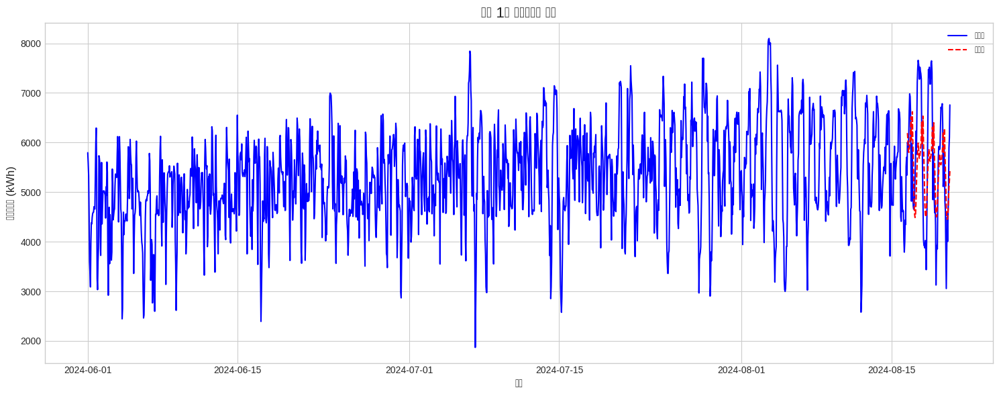

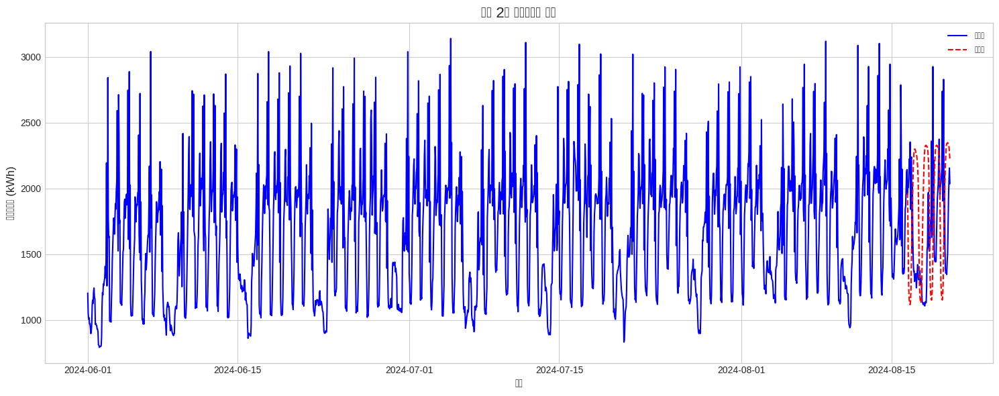

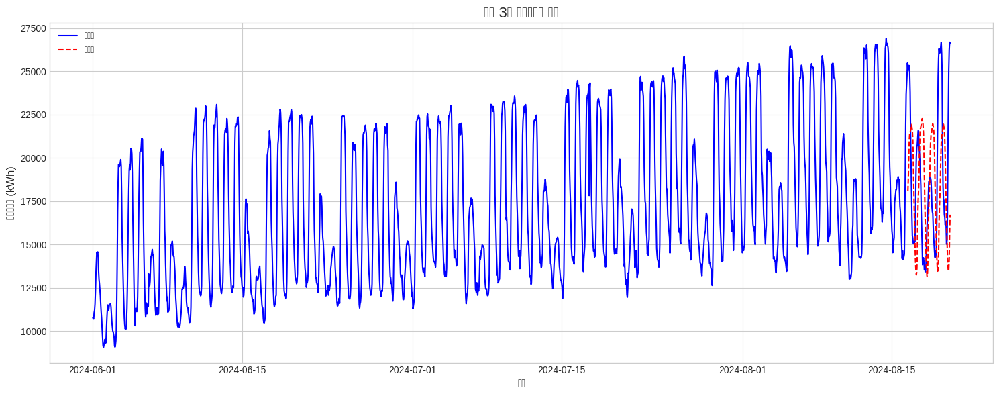

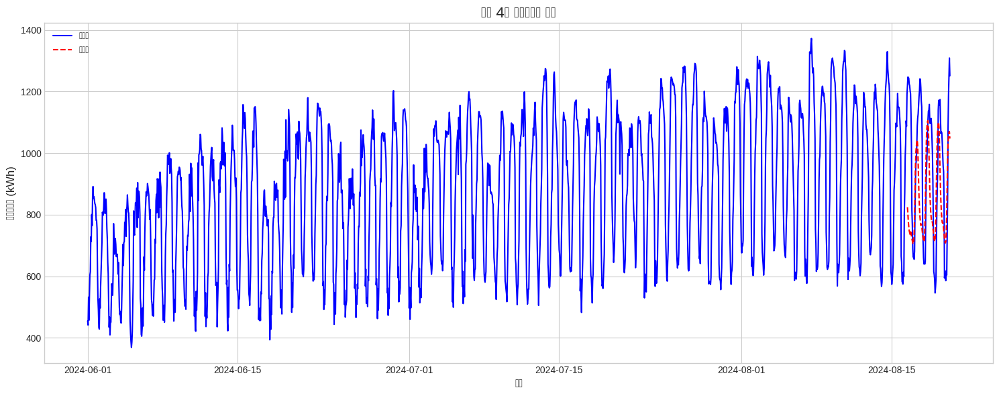

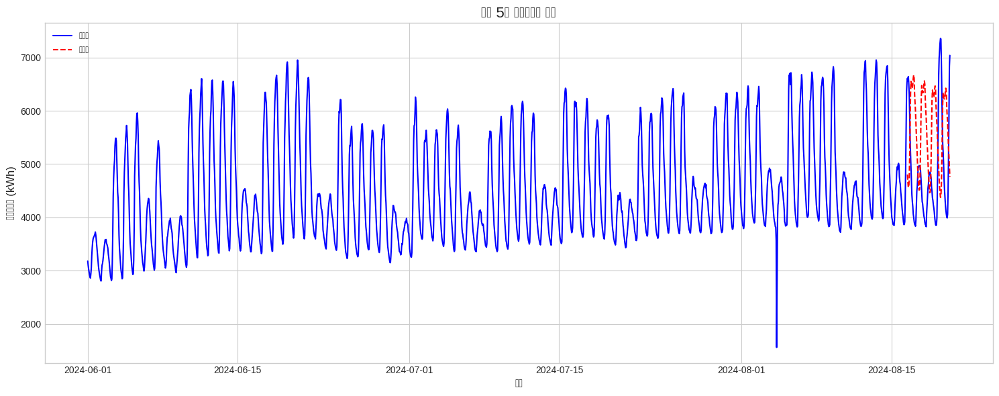

...

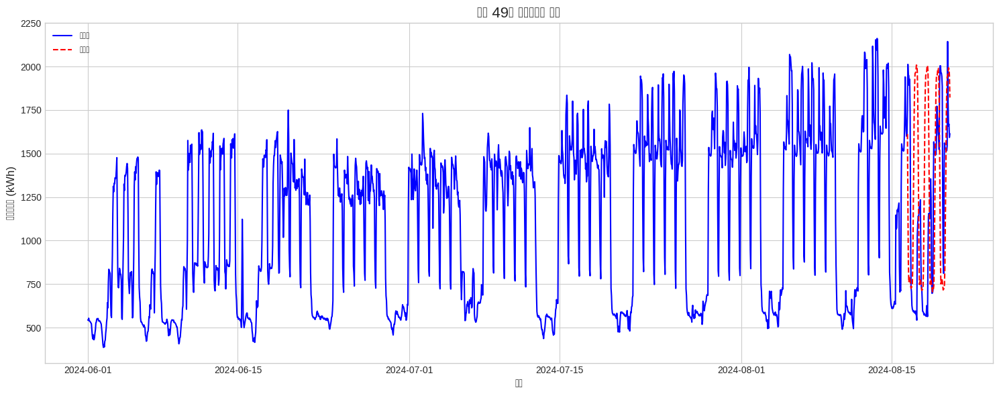

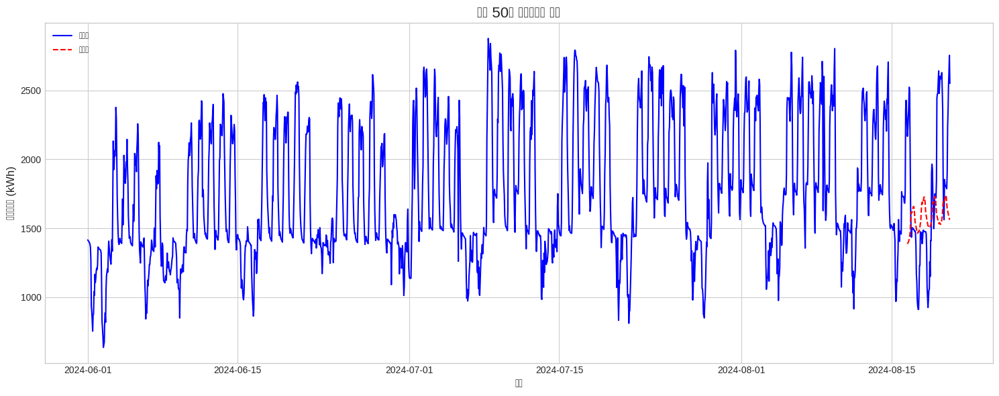

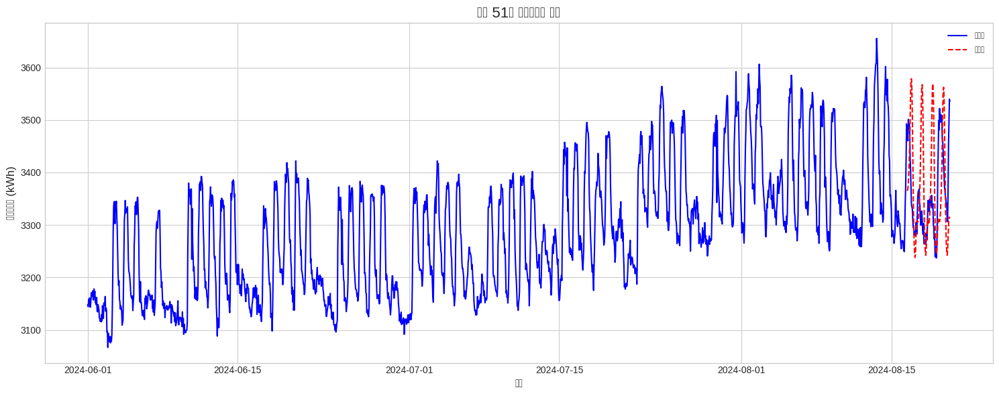

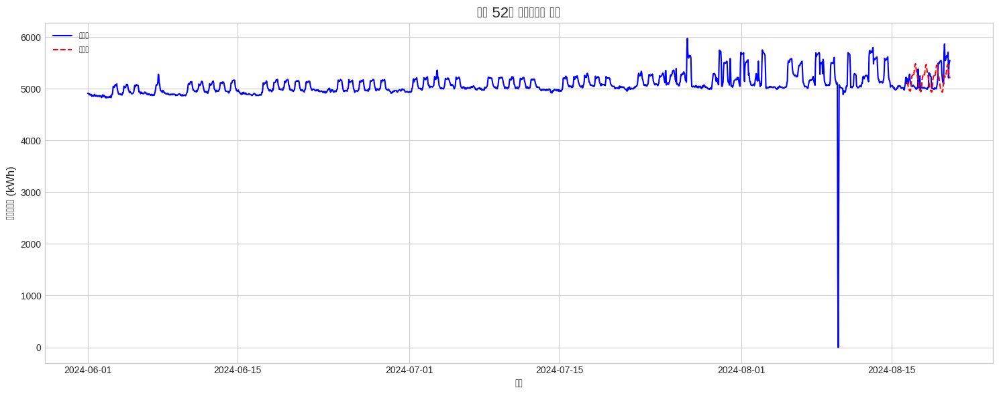

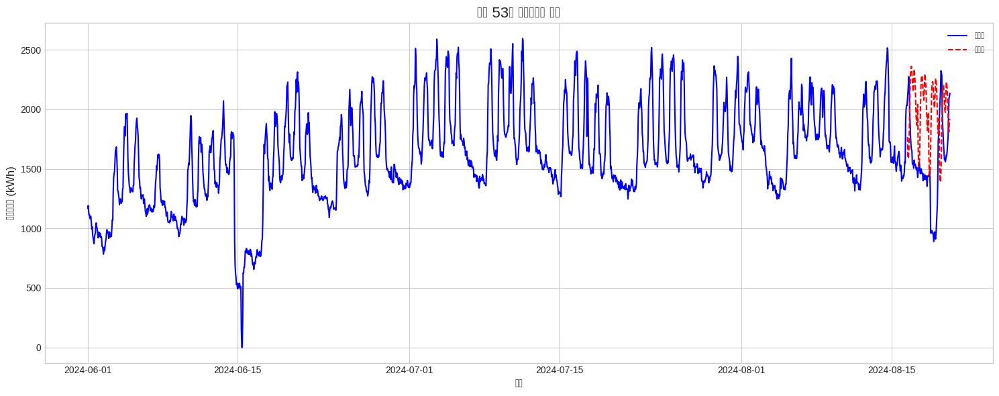

IndexError: index 11015 is out of bounds for axis 0 with size 10900

In [104]:
for i in range(1,101,1):
    plot_predictions_from_eval(
        data=data,
        dset_test=dset_test,
        predictions_dict=predictions_dict,
        split_config=split_config,
        building_id=i,
        forecast_length=PREDICTION_LENGTH,
        tsp=tsp
    )

In [ ]:
predictions_dict

In [97]:
print(len(predictions_dict))
print("0=", predictions_dict[0][0][:5])


3
0= [[[ 0.61709553  1.6241539  -0.16012938  0.14056924 -0.48350492]
  [ 0.8631133   1.6808288  -0.15018547  0.07513034 -0.49201688]
  [ 0.9837188   1.744781   -0.12625073  0.19529688 -0.50879145]
  ...
  [ 0.81200075  0.7546247  -0.15925132 -0.34620613  0.26278633]
  [ 0.77315     0.9638127  -0.13875876 -0.32367632  0.06533603]
  [ 0.7253364   1.1905446  -0.11152348 -0.29253933 -0.12068287]]

 [[ 1.0713621   1.6698219  -0.15208744  0.04529712 -0.5189512 ]
  [ 1.1300946   1.7199224  -0.11545964  0.14905182 -0.5173783 ]
  [ 1.1727102   1.7707736  -0.11655024  0.20344275 -0.51877266]
  ...
  [ 0.8221605   0.9678865  -0.1589099  -0.35741296  0.09692916]
  [ 0.7587434   1.1721464  -0.11940867 -0.33705866 -0.10308273]
  [ 0.8895552   1.3712881  -0.13860689 -0.31441915 -0.2613452 ]]

 [[ 1.0879108   1.8555579  -0.09704369 -0.12126034 -0.604466  ]
  [ 1.1534538   1.8534114  -0.10647042 -0.01031369 -0.5756223 ]
  [ 1.291781    1.7663085  -0.07672231  0.11419944 -0.4797693 ]
  ...
  [ 0.7710993

In [23]:
print(dir(dset_train))
print("dset_train=",dset_train.group_df.head())
print("dset_valid=",dset_valid.group_df.head())
print("dset_test=",dset_test.group_df.head())

['BaseForecastDFDataset', '__add__', '__annotations__', '__class__', '__class_getitem__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__orig_bases__', '__parameters__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__slots__', '__str__', '__subclasshook__', '__weakref__', '_is_protocol', 'cls', 'concat_dataset', 'context_length', 'cummulative_sizes', 'cumsum', 'cumulative_sizes', 'datasets', 'drop_cols', 'extra_kwargs', 'fill_value', 'group_df', 'group_names', 'id_columns', 'n_inp', 'n_targets', 'n_vars', 'num_workers', 'prediction_length', 'stride', 'timestamp_column']
dset_train=                  date      HUFL      HULL      MUFL      MULL      LUFL  \
0 2016-07-01 00:00:00 -0.363123 -0.005760 -0.630712 -0.147523  1.388575   
1 2016-07-01 01:00:00 

 ## Few-shot finetune and evaluation method

In [ ]:
def fewshot_finetune_eval(
    dataset_name,
    batch_size,
    learning_rate=None,
    context_length=512,
    forecast_length=96,
    fewshot_percent=5,
    freeze_backbone=True,
    num_epochs=50,
    save_dir=OUT_DIR,
    loss="mse",
    quantile=0.5,
):
    out_dir = os.path.join(save_dir, dataset_name)

    print("-" * 20, f"Running few-shot {fewshot_percent}%", "-" * 20)

    # Data prep: Get dataset

    tsp = TimeSeriesPreprocessor(
        **column_specifiers,
        context_length=context_length,
        prediction_length=forecast_length,
        scaling=True,
        encode_categorical=False,
        scaler_type="standard",
    )

    # change head dropout to 0.7 for ett datasets
    if "ett" in dataset_name:
        finetune_forecast_model = get_model(
            TTM_MODEL_PATH,
            context_length=context_length,
            prediction_length=forecast_length,
            freq_prefix_tuning=False,
            freq=None,
            prefer_l1_loss=False,
            prefer_longer_context=True,
            # Can also provide TTM Config args
            head_dropout=0.7,
            loss=loss,
            quantile=quantile,
        )
    else:
        finetune_forecast_model = get_model(
            TTM_MODEL_PATH,
            context_length=context_length,
            prediction_length=forecast_length,
            freq_prefix_tuning=False,
            freq=None,
            prefer_l1_loss=False,
            prefer_longer_context=True,
            # Can also provide TTM Config args
            loss=loss,
            quantile=quantile,
        )

    dset_train, dset_val, dset_test = get_datasets(
        tsp,
        data,
        split_config,
        fewshot_fraction=fewshot_percent / 100,
        fewshot_location="first",
        use_frequency_token=finetune_forecast_model.config.resolution_prefix_tuning,
    )

    if freeze_backbone:
        print(
            "Number of params before freezing backbone",
            count_parameters(finetune_forecast_model),
        )

        # Freeze the backbone of the model
        for param in finetune_forecast_model.backbone.parameters():
            param.requires_grad = False

        # Count params
        print(
            "Number of params after freezing the backbone",
            count_parameters(finetune_forecast_model),
        )

    # Find optimal learning rate
    # Use with caution: Set it manually if the suggested learning rate is not suitable
    if learning_rate is None:
        learning_rate, finetune_forecast_model = optimal_lr_finder(
            finetune_forecast_model,
            dset_train,
            batch_size=batch_size,
        )
        print("OPTIMAL SUGGESTED LEARNING RATE =", learning_rate)

    print(f"Using learning rate = {learning_rate}")
    finetune_forecast_args = TrainingArguments(
        output_dir=os.path.join(out_dir, "output"),
        overwrite_output_dir=True,
        learning_rate=learning_rate,
        num_train_epochs=num_epochs,
        do_eval=True,
        eval_strategy="epoch",
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        dataloader_num_workers=8,
        report_to="none",
        save_strategy="epoch",
        logging_strategy="epoch",
        save_total_limit=1,
        logging_dir=os.path.join(out_dir, "logs"),  # Make sure to specify a logging directory
        load_best_model_at_end=True,  # Load the best model when training ends
        metric_for_best_model="eval_loss",  # Metric to monitor for early stopping
        greater_is_better=False,  # For loss
        seed=SEED,
    )

    # Create the early stopping callback
    early_stopping_callback = EarlyStoppingCallback(
        early_stopping_patience=10,  # Number of epochs with no improvement after which to stop
        early_stopping_threshold=1e-5,  # Minimum improvement required to consider as improvement
    )
    tracking_callback = TrackingCallback()

    # Optimizer and scheduler
    optimizer = AdamW(finetune_forecast_model.parameters(), lr=learning_rate)
    scheduler = OneCycleLR(
        optimizer,
        learning_rate,
        epochs=num_epochs,
        steps_per_epoch=math.ceil(len(dset_train) / (batch_size)),
    )

    finetune_forecast_trainer = Trainer(
        model=finetune_forecast_model,
        args=finetune_forecast_args,
        train_dataset=dset_train,
        eval_dataset=dset_val,
        callbacks=[early_stopping_callback, tracking_callback],
        optimizers=(optimizer, scheduler),
    )
    finetune_forecast_trainer.remove_callback(INTEGRATION_TO_CALLBACK["codecarbon"])

    # Fine tune
    finetune_forecast_trainer.train()

    # Evaluation
    print("+" * 20, f"Test MSE after few-shot {fewshot_percent}% fine-tuning", "+" * 20)

    finetune_forecast_trainer.model.loss = "mse"  # fixing metric to mse for evaluation

    fewshot_output = finetune_forecast_trainer.evaluate(dset_test)
    print(fewshot_output)
    print("+" * 60)

    # get predictions

    predictions_dict = finetune_forecast_trainer.predict(dset_test)

    predictions_np = predictions_dict.predictions[0]

    print(predictions_np.shape)

    # get backbone embeddings (if needed for further analysis)

    backbone_embedding = predictions_dict.predictions[1]

    print(backbone_embedding.shape)

    # plot
    plot_predictions(
        model=finetune_forecast_trainer.model,
        dset=dset_test,
        plot_dir=os.path.join(OUT_DIR, dataset_name),
        plot_prefix="test_fewshot",
        indices=[685, 118, 902, 1984, 894, 967, 304, 57, 265, 1015],
        channel=0,
    )

### Few-shot 5%

INFO:p-193553:t-23248377201408:get_model.py:get_model:Loading model from: ibm-granite/granite-timeseries-ttm-r2
INFO:p-193553:t-23248377201408:get_model.py:get_model:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = main.
INFO:p-193553:t-23248377201408:get_model.py:get_model:[TTM] context_length = 512, prediction_length = 96


-------------------- Running few-shot 5% --------------------
Number of params before freezing backbone 805280
Number of params after freezing the backbone 289696
Using learning rate = 0.001


Epoch,Training Loss,Validation Loss
1,0.806300,0.664025
2,0.809300,0.663463
3,0.759700,0.662726
4,0.712000,0.662024
5,0.720700,0.662027
6,0.684800,0.664132
7,0.669900,0.669062
8,0.630200,0.677566
9,0.624800,0.685926
10,0.597700,0.696449


[TrackingCallback] Mean Epoch Time = 0.562150274004255 seconds, Total Train Time = 19.338220834732056
++++++++++++++++++++ Test MSE after few-shot 5% fine-tuning ++++++++++++++++++++


{'eval_loss': 0.36187952756881714, 'eval_runtime': 0.689, 'eval_samples_per_second': 4042.288, 'eval_steps_per_second': 63.864, 'epoch': 14.0}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
(2785, 96, 7)
(2785, 7, 8, 192)


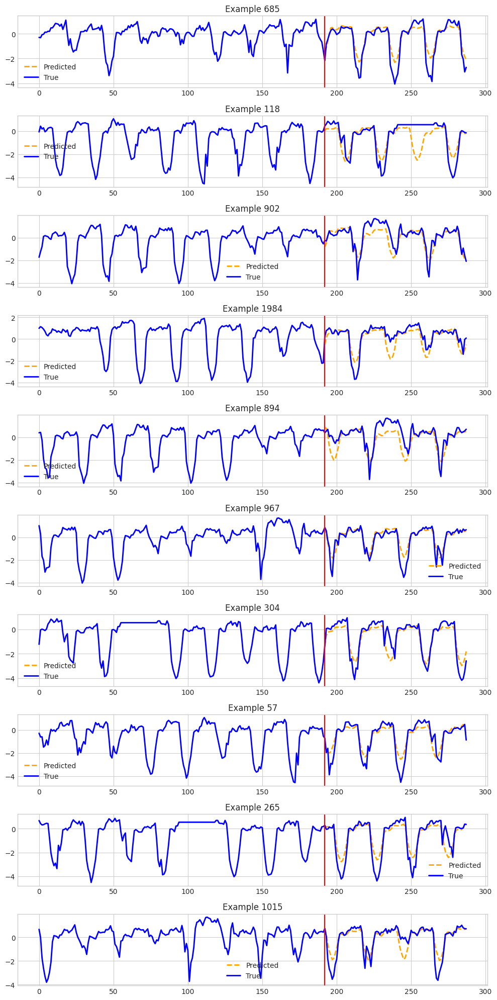

In [ ]:
fewshot_finetune_eval(
    dataset_name=TARGET_DATASET,
    context_length=CONTEXT_LENGTH,
    forecast_length=PREDICTION_LENGTH,
    batch_size=64,
    fewshot_percent=5,
    learning_rate=0.001,
)

# Fewshot with quantile loss (We can use pinball loss to generate different quantiles as required)

INFO:p-193553:t-23248377201408:get_model.py:get_model:Loading model from: ibm-granite/granite-timeseries-ttm-r2
INFO:p-193553:t-23248377201408:get_model.py:get_model:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = main.
INFO:p-193553:t-23248377201408:get_model.py:get_model:[TTM] context_length = 512, prediction_length = 96


-------------------- Running few-shot 5% --------------------
Number of params before freezing backbone 805280
Number of params after freezing the backbone 289696
Using learning rate = 0.001


Epoch,Training Loss,Validation Loss
1,0.327900,0.273010
2,0.324500,0.272937
3,0.317400,0.272860
4,0.311000,0.272869
5,0.309400,0.273278
6,0.305200,0.274445
7,0.297900,0.276200
8,0.291600,0.279156
9,0.288500,0.283543
10,0.286300,0.286393


[TrackingCallback] Mean Epoch Time = 0.561025069310115 seconds, Total Train Time = 17.760613679885864
++++++++++++++++++++ Test MSE after few-shot 5% fine-tuning ++++++++++++++++++++


{'eval_loss': 0.36178672313690186, 'eval_runtime': 0.7961, 'eval_samples_per_second': 3498.122, 'eval_steps_per_second': 55.267, 'epoch': 13.0}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
(2785, 96, 7)
(2785, 7, 8, 192)


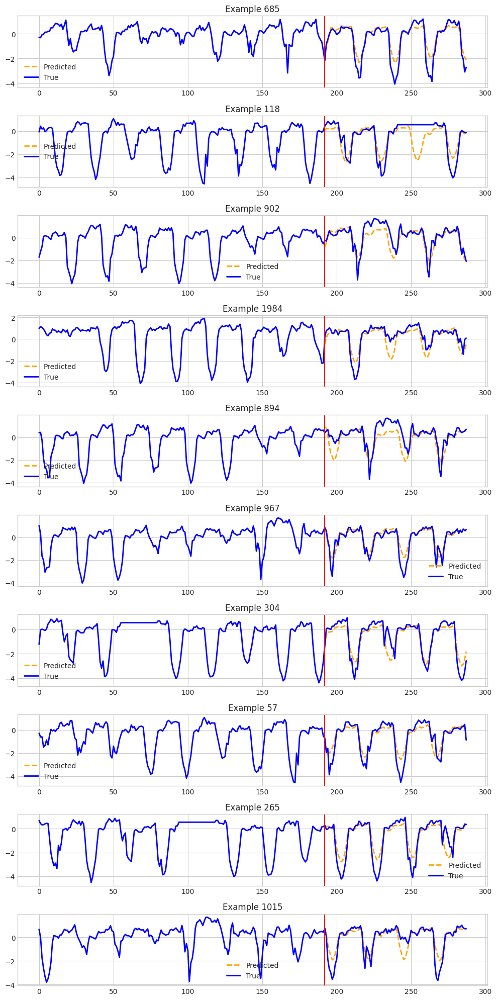

In [ ]:
fewshot_finetune_eval(
    dataset_name=TARGET_DATASET,
    context_length=CONTEXT_LENGTH,
    forecast_length=PREDICTION_LENGTH,
    batch_size=64,
    fewshot_percent=5,
    learning_rate=0.001,
    loss="pinball",
    quantile=0.5,
)

## Example: TTM for other forecast horizon lengths and context lengths

The minimum / maximum supported context length for the Granite-TTM-R2 models are 52 and 1536 respectively. Whereas the maximum supported prediction length for Granite-TTM-R2 is 720. (For other models, see the respective model cards)

However, we can ask for a different context length or forecast length, and the `get_model()` utility will choose the closest possible TTM from the model suite. We have to make sure that the required context and prediction lengths are passed to the `TimeSeriesPreprocessor()` so that the data batches are generated correctly. In this notebook, this is handled in the `zeroshot_eval()` and `fewshot_finetune_eval()` functions.

### Zero-shot

INFO:p-193553:t-23248377201408:get_model.py:get_model:Loading model from: ibm-granite/granite-timeseries-ttm-r2
INFO:p-193553:t-23248377201408:get_model.py:get_model:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = 1024-96-r2.
INFO:p-193553:t-23248377201408:get_model.py:get_model:[TTM] context_length = 1024, prediction_length = 96


++++++++++++++++++++ Test MSE zero-shot ++++++++++++++++++++


{'eval_loss': 0.33274462819099426, 'eval_model_preparation_time': 0.0017, 'eval_runtime': 0.899, 'eval_samples_per_second': 3151.371, 'eval_steps_per_second': 50.057}
(2833, 48, 7)
(2833, 7, 8, 384)


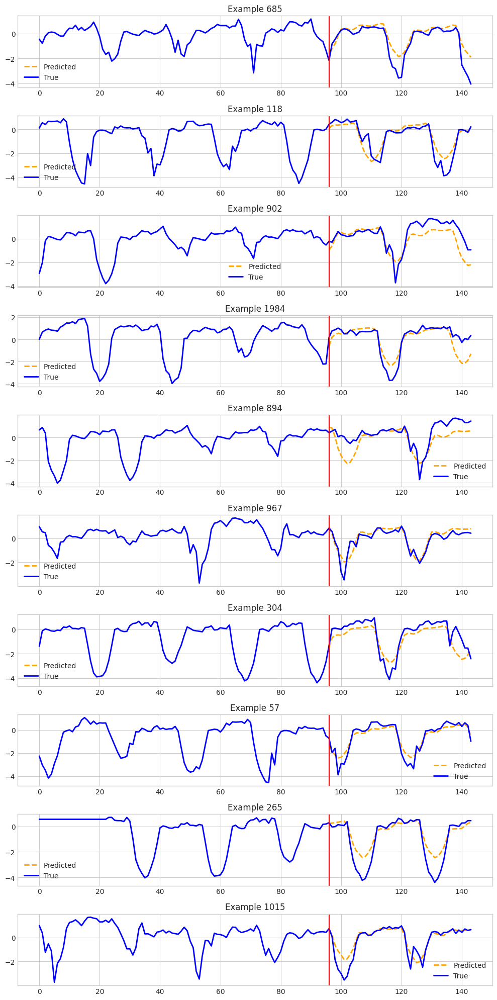

In [ ]:
zeroshot_eval(dataset_name=TARGET_DATASET, context_length=1024, forecast_length=48, batch_size=64)

### Few-shot 5%

INFO:p-193553:t-23248377201408:get_model.py:get_model:Loading model from: ibm-granite/granite-timeseries-ttm-r2
INFO:p-193553:t-23248377201408:get_model.py:get_model:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = 1536-96-r2.
INFO:p-193553:t-23248377201408:get_model.py:get_model:[TTM] context_length = 1536, prediction_length = 96
INFO:p-193553:t-23248377201408:lr_finder.py:optimal_lr_finder:LR Finder: Running learning rate (LR) finder algorithm. If the suggested LR is very low, we suggest setting the LR manually.
INFO:p-193553:t-23248377201408:lr_finder.py:optimal_lr_finder:LR Finder: Using GPU:0.


-------------------- Running few-shot 5% --------------------
Number of params before freezing backbone 3081120
Number of params after freezing the backbone 1054560


INFO:p-193553:t-23248377201408:lr_finder.py:optimal_lr_finder:LR Finder: Suggested learning rate = 0.00035938136638046257


OPTIMAL SUGGESTED LEARNING RATE = 0.00035938136638046257
Using learning rate = 0.00035938136638046257


Epoch,Training Loss,Validation Loss
1,0.558300,0.504625
2,0.522800,0.505693
3,0.492200,0.506962
4,0.483700,0.508520
5,0.397600,0.510497
6,0.323300,0.514045
7,0.345200,0.525361
8,0.280800,0.541318
9,0.238600,0.550981
10,0.221500,0.592485


[TrackingCallback] Mean Epoch Time = 0.5700289119373668 seconds, Total Train Time = 17.286776304244995
++++++++++++++++++++ Test MSE after few-shot 5% fine-tuning ++++++++++++++++++++


{'eval_loss': 0.32994186878204346, 'eval_runtime': 0.9431, 'eval_samples_per_second': 3003.961, 'eval_steps_per_second': 47.716, 'epoch': 11.0}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
(2833, 48, 7)
(2833, 7, 12, 384)


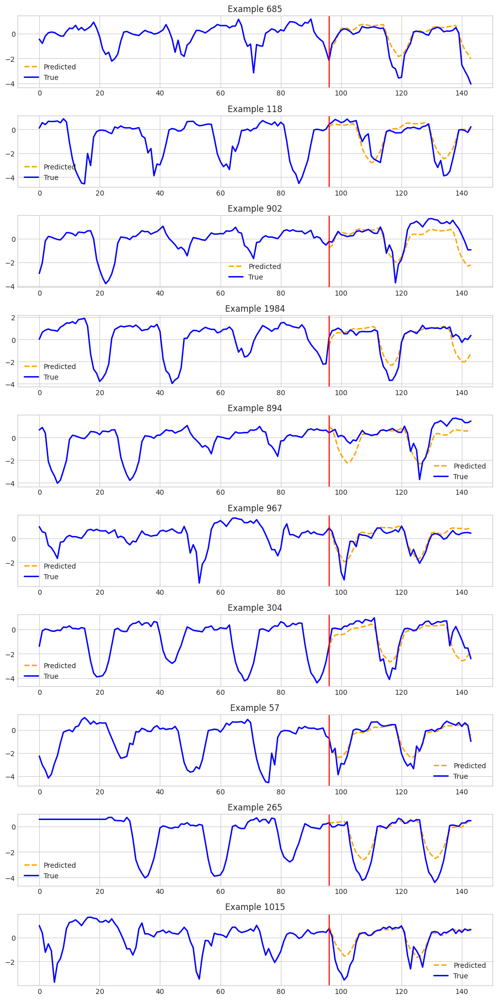

In [ ]:
fewshot_finetune_eval(
    dataset_name=TARGET_DATASET,
    context_length=1536,
    forecast_length=48,
    batch_size=64,
    fewshot_percent=5,
    learning_rate=None,
)